In [1]:
import numpy as np
import pandas as pd
from astropy.table import Table, vstack
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
from glob import glob
from astropy.timeseries import LombScargle
from scipy import stats
import warnings
from TESStools import *

In [2]:
set_data_dir('../data/all_massive_lcs/')
data_dir

'../data/all_massive_lcs/'

In [3]:
massive_observed = pd.read_csv('../data/massive_observed.csv')
massive_observed

,TIC ID,RA,Dec,dist,pmRA,pmDec,Tmag,ContRatio,SpT,CommonName,MKType,SimbadOType,SimbadSpT
0,467274664,168.150054,-60.317625,0.072792,-6.11843,1.704890,4.00680,NaN,YSG,* y Car,A6Ia,SG*,A5Iae:
1,451860101,172.941949,-59.442060,0.129217,-4.06885,1.353320,4.02620,NaN,YSG,* omi01 Cen,G0Ia,LPV*,G3_0-Ia
2,464732822,156.851954,-57.638803,0.089453,-6.54339,3.183610,4.08570,NaN,YSG,V* V399 Car,A6Ia,Cepheid,A9/F0Ia/ab
3,265186608,349.849050,62.739776,0.016288,-2.25655,-2.004000,4.11718,NaN,RSG,V* V809 Cas,K5Ib,LPV*,K4.5Ib
4,390806332,44.102706,64.332444,0.004732,-3.73911,0.017250,4.12420,NaN,RSG,HD 17958,K3Ibvar,V*,K3Ib
...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,40515514,77.495018,-69.117163,0.026671,2.31089,0.180033,11.52570,NaN,YSG,SK -69 68,B1II,Star,B1II
164,40603917,77.966997,-67.166039,0.176016,1.55205,0.179161,11.73570,NaN,YSG,SK -67 57,B2III,Star,B2III
165,404768745,84.654009,-69.085522,0.182465,1.88635,0.907908,11.87760,NaN,YSG,RMC 137,B1.5IaNstr,BlueSG*,B1Ia
166,277172433,84.236721,-69.271768,0.075312,1.77836,0.619870,11.92190,NaN,YSG,CPD-69 430,B8I,Star,B8I


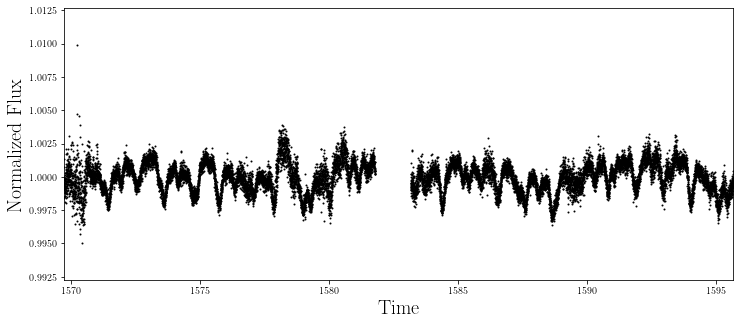

In [4]:
lc, lc_smooth = lc_extract(get_lc_from_id(458859916), smooth=128)
time, flux, err = lc['Time'], lc['Flux'], lc['Err']
fig,ax = plt.subplots(figsize=(12,5))
ax.scatter(time,flux,s=1,c='k')
#ax[1].scatter(time[(time > 1400)&(time < 1500)],flux[(time > 1400)&(time < 1500)],s=1,c='k')
#ax[2].scatter(time[(time > 1440)&(time < 1450)],flux[(time > 1440)&(time < 1450)],s=1,c='k')

ax.set_xlim(np.min(time),np.max(time))

ax.set_xlabel('Time',fontsize=20)
ax.set_ylabel('Normalized Flux',fontsize=20)
plt.savefig('EtaCarWut')

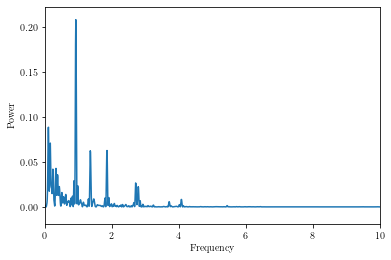

In [5]:
ls = LombScargle(time,flux,dy=err)
freq,power=ls.autopower()
plt.plot(freq,power)
plt.xlim(0,10)
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.savefig('EtaCarLSWut')

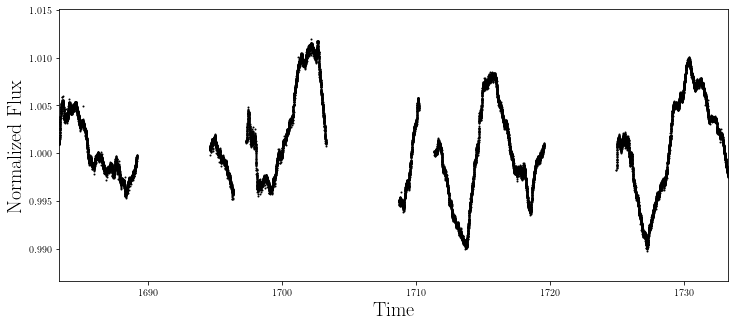

In [6]:
lc, lc_smooth = lc_extract(get_lc_from_id(12149245), smooth=128)
time, flux, err = lc['Time'], lc['Flux'], lc['Err']
fig,ax = plt.subplots(figsize=(12,5))
ax.scatter(time,flux,s=1,c='k')
#ax[1].scatter(time[(time > 1400)&(time < 1500)],flux[(time > 1400)&(time < 1500)],s=1,c='k')
#ax[2].scatter(time[(time > 1440)&(time < 1450)],flux[(time > 1440)&(time < 1450)],s=1,c='k')

ax.set_xlim(np.min(time),np.max(time))

ax.set_xlabel('Time',fontsize=20)
ax.set_ylabel('Normalized Flux',fontsize=20)
plt.savefig('PCygWut')

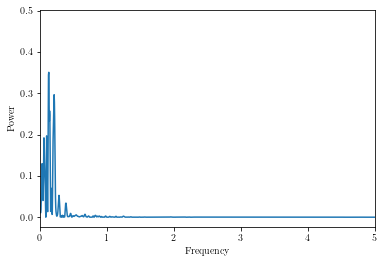

In [8]:
ls = LombScargle(time,flux,dy=err)
freq,power=ls.autopower()
plt.plot(freq,power)
plt.xlim(0,5)
plt.xlabel('Frequency')
plt.ylabel('Power')
plt.savefig('PCygLSWut')

In [31]:
def print_factors(x):
    for i in range(1, int(np.ceil(np.sqrt(x)))+1):
        if x % i == 0:
            print(i, x/i)
print_factors(54)

1 54.0
2 27.0
3 18.0
6 9.0


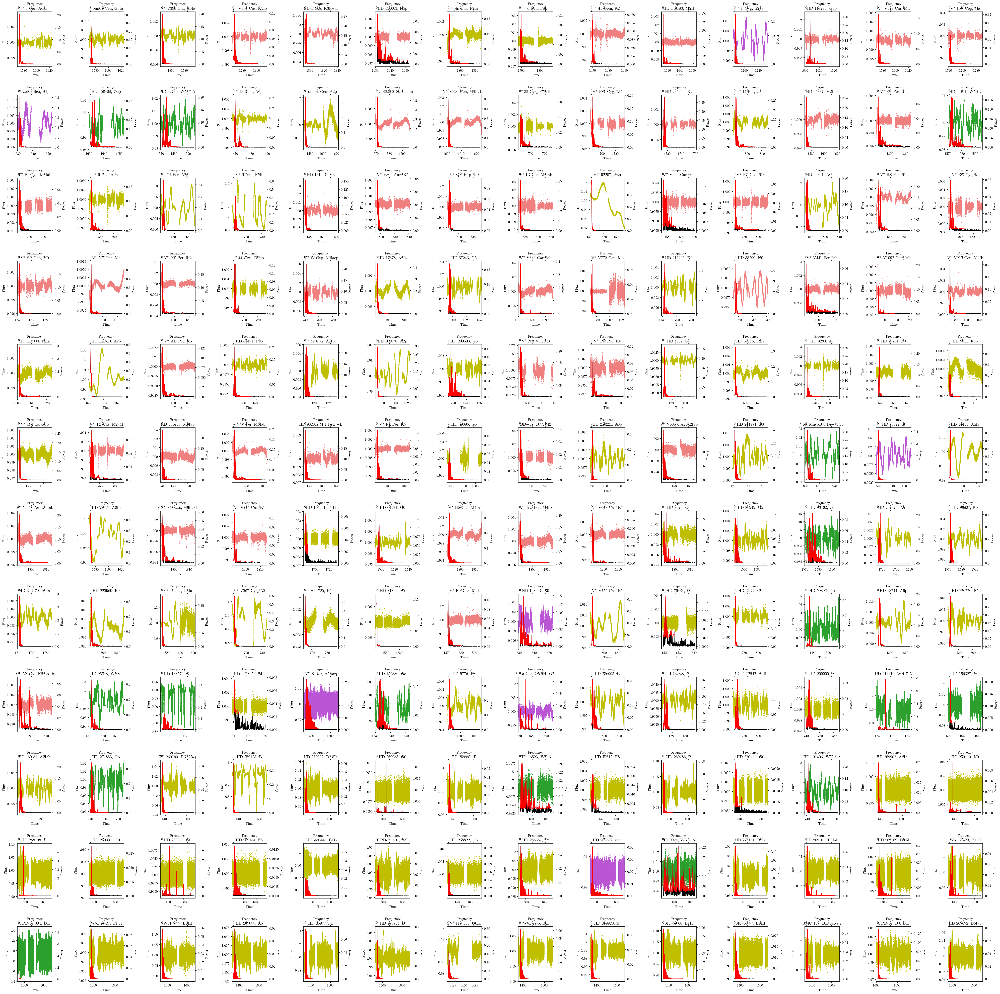

In [16]:
fig, axes = plt.subplots(12,14,figsize=(40,40),dpi=150)
c_dict = {'WR':'C2','LBV':'mediumorchid','YSG':'y','RSG':'lightcoral'}
from tqdm.notebook import tqdm
for ax,(j,row) in tqdm(zip(axes.flatten(),massive_observed.iterrows()),total=len(massive_observed)):
    lc, lc_smooth = lc_extract(get_lc_from_id(row['TIC ID']), smooth=128)
    time, flux, err = lc['Time'], lc['Flux'], lc['Err']
    ax.scatter(time,flux,s=1,c=c_dict[row['SpT']])
    ax.set(xlim=(np.min(time),np.max(time)),xlabel='Time',ylabel='Flux',title=f'{row["CommonName"]}, {row["MKType"]}')
    lsax = fig.add_subplot(12,14,j+1, label="1", frame_on=False)
    ls = LombScargle(time,flux,dy=err)
    freq,power=ls.autopower(maximum_frequency=5)
    fal = ls.false_alarm_level(0.01)
    lsax.plot(freq,power,c='k')
    lsax.plot(freq[power >= fal],power[power >= fal],c='r')
    lsax.set_xlabel('Frequency') 
    lsax.set_ylabel('Power')       
    lsax.xaxis.set_label_position('top') 
    lsax.yaxis.set_label_position('right') 
    lsax.xaxis.tick_top()
    lsax.yaxis.tick_right()
plt.tight_layout()
plt.savefig('all_massive_stars')

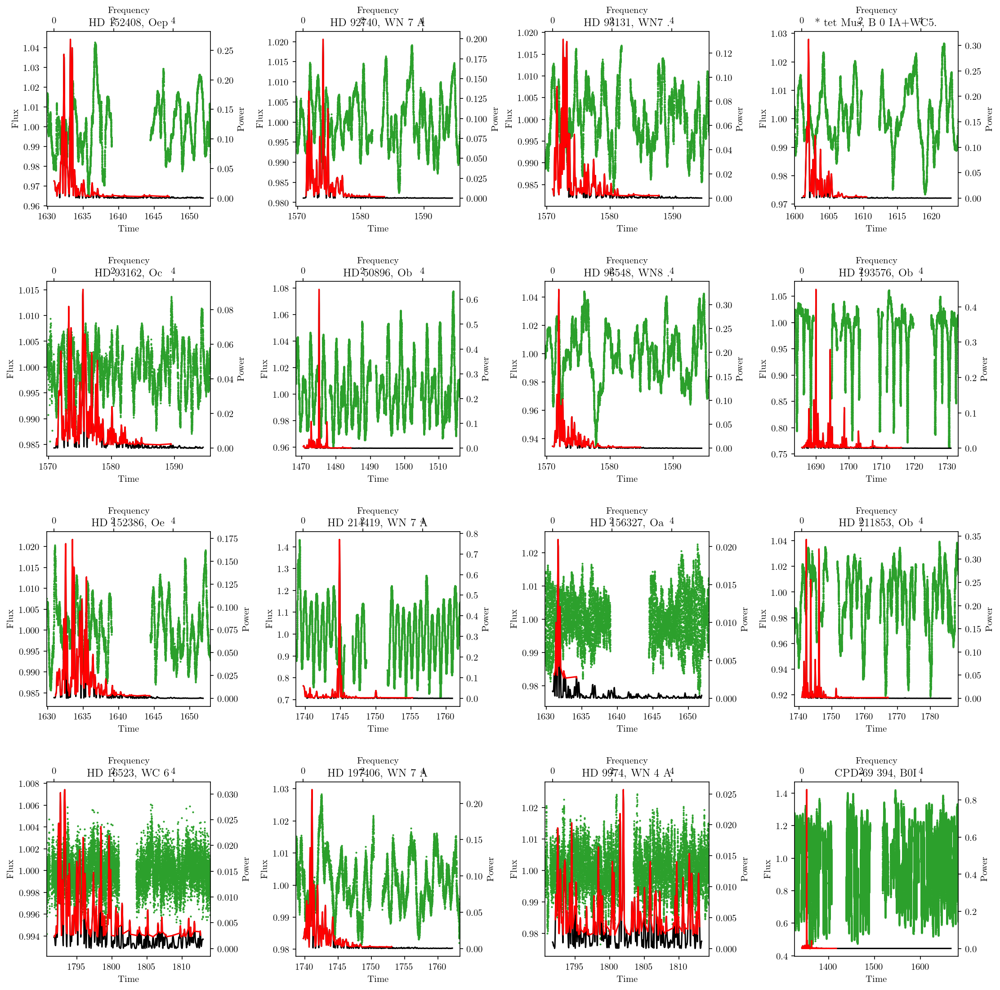

In [20]:
fig, axes = plt.subplots(4,4,figsize=(15,15),dpi=150)
wrs = massive_observed[massive_observed['SpT']=='WR'].reset_index(drop=True)
from tqdm.notebook import tqdm
for ax,(j,row) in tqdm(zip(axes.flatten(),wrs.iterrows()),total=len(wrs)):
    lc, lc_smooth = lc_extract(get_lc_from_id(row['TIC ID']), smooth=128)
    time, flux, err = lc['Time'], lc['Flux'], lc['Err']
    ax.scatter(time,flux,s=1,c=c_dict[row['SpT']])
    ax.set(xlim=(np.min(time),np.max(time)),xlabel='Time',ylabel='Flux',title=f'{row["CommonName"]}, {row["MKType"]}')
    lsax = fig.add_subplot(4,4,j+1, label="1", frame_on=False)
    ls = LombScargle(time,flux,dy=err)
    freq,power=ls.autopower(maximum_frequency=5)
    fal = ls.false_alarm_level(0.01)
    lsax.plot(freq,power,c='k')
    lsax.plot(freq[power >= fal],power[power >= fal],c='r')
    lsax.set_xlabel('Frequency') 
    lsax.set_ylabel('Power')       
    lsax.xaxis.set_label_position('top') 
    lsax.yaxis.set_label_position('right') 
    lsax.xaxis.tick_top()
    lsax.yaxis.tick_right()
plt.tight_layout()
plt.savefig('all_WRs')

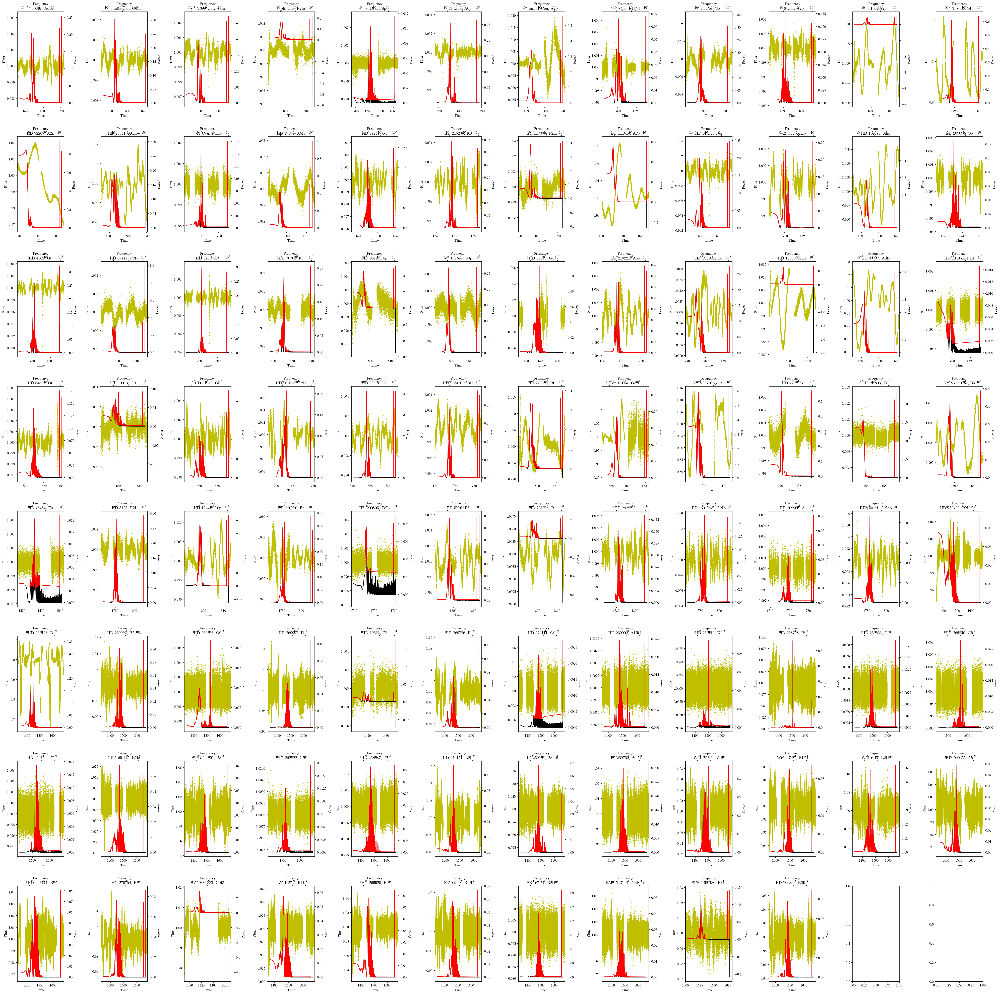

In [34]:
fig, axes = plt.subplots(8,12,figsize=(40,40),dpi=150)
ysgs = massive_observed[massive_observed['SpT']=='YSG'].reset_index(drop=True)
from tqdm.notebook import tqdm
for ax,(j,row) in tqdm(zip(axes.flatten(),ysgs.iterrows()),total=len(ysgs)):
    lc, lc_smooth = lc_extract(get_lc_from_id(row['TIC ID']), smooth=128)
    time, flux, err = lc['Time'], lc['Flux'], lc['Err']
    ax.scatter(time,flux,s=1,c=c_dict[row['SpT']])
    ax.set(xlim=(np.min(time),np.max(time)),xlabel='Time',ylabel='Flux',title=f'{row["CommonName"]}, {row["MKType"]}')
    lsax = fig.add_subplot(8,12,j+1, label="1", frame_on=False)
    ls = LombScargle(time,flux,dy=err)
    freq,power=ls.autopower()
    fal = ls.false_alarm_level(0.01)
    lsax.plot(freq,power,c='k')
    lsax.plot(freq[power >= fal],power[power >= fal],c='r')
    lsax.set(xscale='log')
    lsax.set_xlabel('Frequency') 
    lsax.set_ylabel('Power')       
    lsax.xaxis.set_label_position('top') 
    lsax.yaxis.set_label_position('right') 
    lsax.xaxis.tick_top()
    lsax.yaxis.tick_right()
plt.tight_layout()
plt.savefig('all_YSGs')

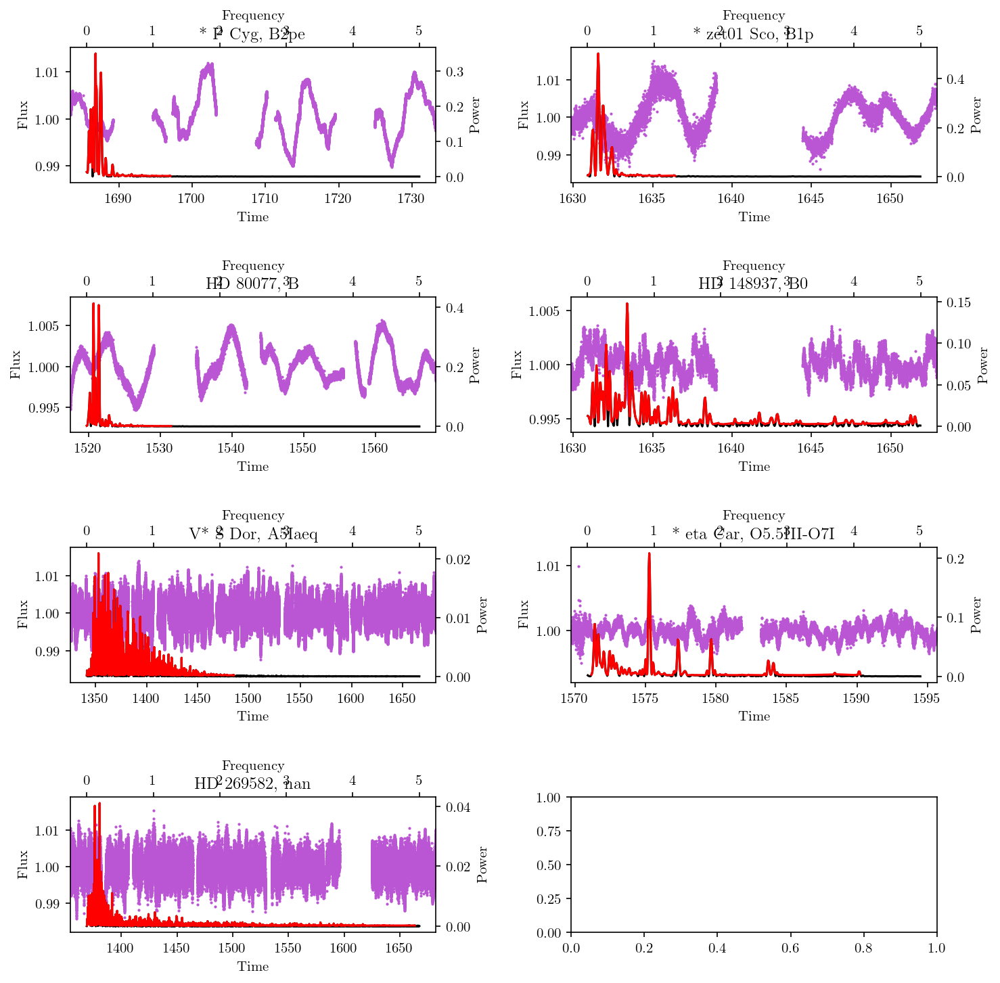

In [27]:
fig, axes = plt.subplots(4,2,figsize=(10,10),dpi=150)
lbvs = massive_observed[massive_observed['SpT']=='LBV'].reset_index(drop=True)
from tqdm.notebook import tqdm
for ax,(j,row) in tqdm(zip(axes.flatten(),lbvs.iterrows()),total=len(lbvs)):
    lc, lc_smooth = lc_extract(get_lc_from_id(row['TIC ID']), smooth=128)
    time, flux, err = lc['Time'], lc['Flux'], lc['Err']
    ax.scatter(time,flux,s=1,c=c_dict[row['SpT']])
    ax.set(xlim=(np.min(time),np.max(time)),xlabel='Time',ylabel='Flux',title=f'{row["CommonName"]}, {row["MKType"]}')
    lsax = fig.add_subplot(4,2,j+1, label="1", frame_on=False)
    ls = LombScargle(time,flux,dy=err)
    freq,power=ls.autopower(maximum_frequency=5)
    fal = ls.false_alarm_level(0.01)
    lsax.plot(freq,power,c='k')
    lsax.plot(freq[power >= fal],power[power >= fal],c='r')
    lsax.set_xlabel('Frequency') 
    lsax.set_ylabel('Power')       
    lsax.xaxis.set_label_position('top') 
    lsax.yaxis.set_label_position('right') 
    lsax.xaxis.tick_top()
    lsax.yaxis.tick_right()
plt.tight_layout()
plt.savefig('all_LBVs')

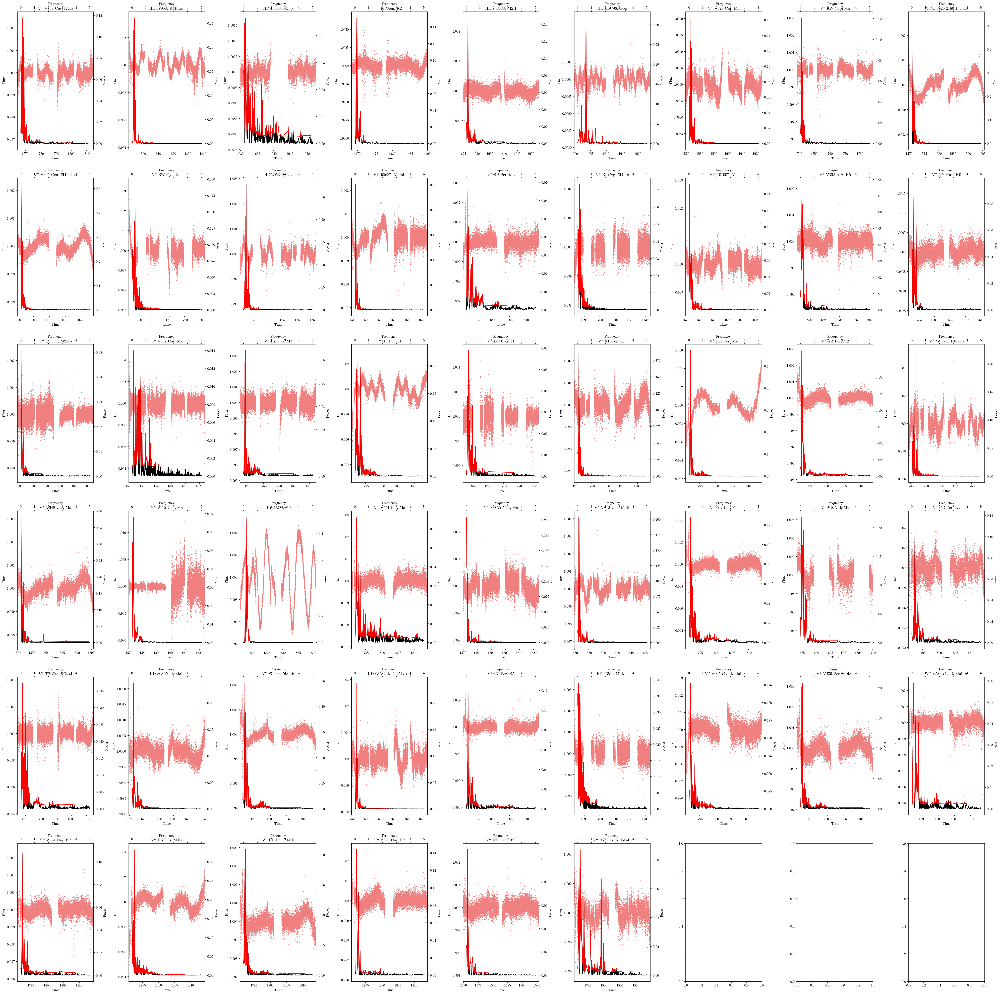

In [33]:
fig, axes = plt.subplots(6,9,figsize=(40,40),dpi=150)
rsgs = massive_observed[massive_observed['SpT']=='RSG'].reset_index(drop=True)
from tqdm.notebook import tqdm
for ax,(j,row) in tqdm(zip(axes.flatten(),rsgs.iterrows()),total=len(rsgs)):
    lc, lc_smooth = lc_extract(get_lc_from_id(row['TIC ID']), smooth=128)
    time, flux, err = lc['Time'], lc['Flux'], lc['Err']
    ax.scatter(time,flux,s=1,c=c_dict[row['SpT']])
    ax.set(xlim=(np.min(time),np.max(time)),xlabel='Time',ylabel='Flux',title=f'{row["CommonName"]}, {row["MKType"]}')
    lsax = fig.add_subplot(6,9,j+1, label="1", frame_on=False)
    ls = LombScargle(time,flux,dy=err)
    freq,power=ls.autopower(maximum_frequency=5)
    fal = ls.false_alarm_level(0.01)
    lsax.plot(freq,power,c='k')
    lsax.plot(freq[power >= fal],power[power >= fal],c='r')
    lsax.set_xlabel('Frequency') 
    lsax.set_ylabel('Power')       
    lsax.xaxis.set_label_position('top') 
    lsax.yaxis.set_label_position('right') 
    lsax.xaxis.tick_top()
    lsax.yaxis.tick_right()
plt.tight_layout()
plt.savefig('all_RSGs')